
--- 结果分析 ---
分数最高的 K 值是: 20 (分数为: 0.6884)
请查看弹出的图表来做最终决定。


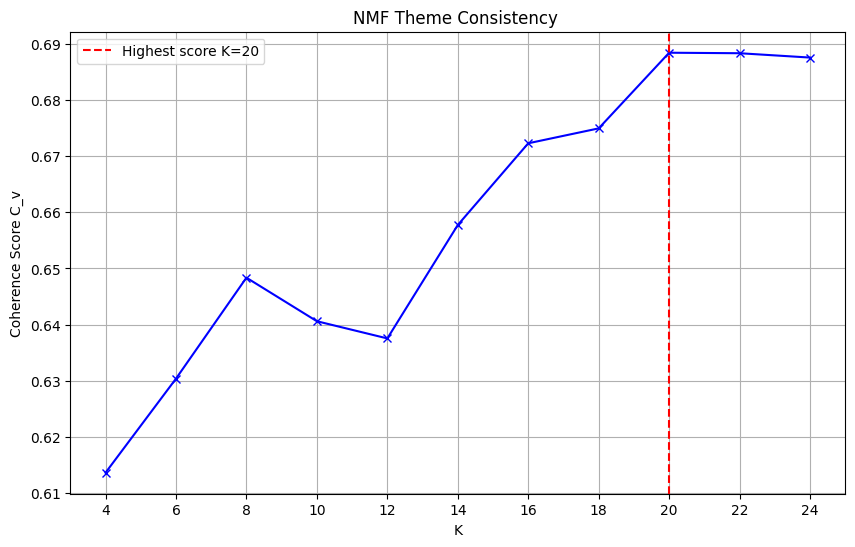

In [ ]:
import os
import pickle
import pandas as pd
import matplotlib.pyplot as plt
# from google.colab import drive

# --- 0. 安装和导入所需库 ---
# gensim 用于计算主题一致性
# !pip install gensim -q
from sklearn.decomposition import NMF
from gensim.models.coherencemodel import CoherenceModel
from gensim.corpora.dictionary import Dictionary

print("\n--- 库导入完成 ---")

# --- 1. 挂载 Google Drive 并设置路径 ---
# try:
#     drive.mount('/content/drive')
#     print("Google Drive 挂载成功！")
# except Exception as e:
#     print(f"Google Drive 挂载失败: {e}")
#     # 如果挂载失败，后续将无法继续
#     raise RuntimeError("Drive 挂载失败，请检查权限。")

TOPICS_DF_FILE = "../processed_papers_WITH_TOPICS.pkl"
TFIDF_MATRIX_FILE = "../tfidf_matrix.pkl"
VECTORIZER_FILE = "../tfidf_vectorizer.pkl"

# 我们将把昂贵的计算结果也缓存在你的项目路径中
COHERENCE_CACHE_FILE = "../nmf_coherence_scores.pkl"


# --- 2. 加载所需数据 ---
print("\n--- 正在加载数据... ---")

# 2.1 加载 TF-IDF 矩阵
if os.path.exists(TFIDF_MATRIX_FILE):
    with open(TFIDF_MATRIX_FILE, 'rb') as f:
        tfidf_matrix = pickle.load(f)
    print(f" > 成功加载: tfidf_matrix (形状: {tfidf_matrix.shape})")
else:
    raise FileNotFoundError(f"未找到 TFIDF 矩阵文件: {TFIDF_MATRIX_FILE}")

# 2.2 加载 Vectorizer 并提取 feature_names
if os.path.exists(VECTORIZER_FILE):
    with open(VECTORIZER_FILE, 'rb') as f:
        tfidf_vectorizer = pickle.load(f)
    feature_names = tfidf_vectorizer.get_feature_names_out()
    print(f" > 成功加载: tfidf_vectorizer")
    print(f" > 成功提取: {len(feature_names)} 个 feature_names (单词)")
else:
    raise FileNotFoundError(f"未找到 Vectorizer 文件: {VECTORIZER_FILE}")

# 2.3 加载分词后的原始文本 (!!! 关键 !!!)
# 主题一致性 (c_v) 模型需要 *原始* 的分词列表 (a list of lists of strings)
# 它 *不能* 使用 TF-IDF 矩阵.
tokenized_texts = None
if os.path.exists(TOPICS_DF_FILE):
    print(f" > 正在从 {TOPICS_DF_FILE} 加载原始文本...")
    df_for_tokens = pd.read_pickle(TOPICS_DF_FILE)

    # (!!!) 假设你的分词列表在 'processed_text' 这一列
    # (!!!) 如果列名不同 (例如 'tokens' 或 'abstract_tokenized'),
    # (!!!) 请修改下面这行!
    TOKEN_COLUMN_NAME = 'processed_text' # <-- 检查并修改这个!

    if TOKEN_COLUMN_NAME in df_for_tokens.columns:
        tokenized_texts = df_for_tokens[TOKEN_COLUMN_NAME].tolist()
        print(f" > 成功从 '{TOKEN_COLUMN_NAME}' 列加载了 {len(tokenized_texts)} 个文档。")
    else:
        print(f"!!! 错误: 在 {TOPICS_DF_FILE} 中未找到 '{TOKEN_COLUMN_NAME}' 列。")
        print(f"    可用列: {df_for_tokens.columns.tolist()}")
        print("    请将 'TOKEN_COLUMN_NAME' 变量修改为正确的列名。")
else:
    print(f"!!! 错误: 未找到 {TOPICS_DF_FILE}。无法加载 tokenized_texts。")

# 检查是否成功加载
if tokenized_texts is None:
    raise ValueError("无法获取 'tokenized_texts'。请检查上面的错误并修复数据加载部分。")

print("--- 所有数据加载完毕。 ---")


# --- 3. 设置 K 值搜索范围和 NMF 参数 ---

# 你想要测试的 K 值范围
# (建议范围不要太大，例如 4 到 30，步长为 2)
K_VALUES_RANGE = range(4, 25, 2)

# NMF 的固定参数 (与你的主脚本保持一致)
NMF_PARAMS = {
    'random_state': 42,
    'init': 'nndsvda',
    'l1_ratio': 0.5,
    'max_iter': 500, # 使用与你主脚本一致的迭代次数
    'solver': 'cd'
}

# --- 4. 准备 Gensim 所需的字典 ---
print("\n--- 正在创建 Gensim 字典 (用于计算一致性)... ---")
id2word_dictionary = Dictionary(tokenized_texts)
print(" > 字典创建完毕。")


# --- 5. 辅助函数：从 Sklearn NMF 中提取主题 ---
def get_topics_from_nmf(nmf_model, feature_names, top_n=10):
    """从训练好的 sklearn NMF 模型中提取 Top-N 关键词"""
    topics = []
    for topic_idx, topic in enumerate(nmf_model.components_):
        # 获取 Top-N 单词的索引，然后用 feature_names 转换
        top_words_indices = topic.argsort()[:-top_n - 1:-1]
        top_words = [feature_names[i] for i in top_words_indices]
        topics.append(top_words)
    return topics

# --- 6. 遍历和计算 (带缓存功能，可中断) ---

# 尝试加载已有的缓存
if os.path.exists(COHERENCE_CACHE_FILE):
    print(f"--- 正在加载已缓存的一致性分数: {COHERENCE_CACHE_FILE} ---")
    with open(COHERENCE_CACHE_FILE, 'rb') as f:
        coherence_scores = pickle.load(f)
else:
    coherence_scores = {} # K值 -> 分数

print(f"将要测试的 K 值: {list(K_VALUES_RANGE)}")

for k in K_VALUES_RANGE:
    # --- 效率提升点: 跳过已计算的 K ---
    if k in coherence_scores:
        print(f" > K={k} 的分数已在缓存中，跳过。 (分数: {coherence_scores[k]:.4f})")
        continue

    # --- 训练模型 (昂贵步骤) ---
    print(f"--- 正在训练 K={k} ... (这会很慢，请耐心等待) ---")
    nmf_model = NMF(n_components=k, **NMF_PARAMS)
    nmf_model.fit(tfidf_matrix)
    print(f" > K={k} 训练完成。")

    # --- 计算一致性 (昂贵步骤) ---
    print(f" > 正在为 K={k} 计算一致性分数...")
    # 1. 提取主题词
    topics_list = get_topics_from_nmf(nmf_model, feature_names, top_n=10)

    # 2. 计算 C_v 一致性
    coherence_model = CoherenceModel(
        topics=topics_list,
        texts=tokenized_texts,
        dictionary=id2word_dictionary,
        coherence='c_v' # 'c_v' 是一个常用且鲁棒的指标
    )
    score = coherence_model.get_coherence()
    coherence_scores[k] = score
    print(f" > K={k} 一致性分数 = {score:.4f}")

    # --- 关键: 实时保存缓存到你的 Drive ---
    try:
        with open(COHERENCE_CACHE_FILE, 'wb') as f:
            pickle.dump(coherence_scores, f)
        print(f" > 缓存已更新到 Drive: {COHERENCE_CACHE_FILE}")
    except Exception as e:
        print(f"!!! 警告: 缓存保存失败: {e}")

print("\n--- 所有 K 值已计算完毕 ---")


# --- 7. 绘图和分析结果 ---
if coherence_scores:
    # 将字典排序，以便绘图
    sorted_scores = sorted(coherence_scores.items())
    k_list = [k for k, v in sorted_scores]
    scores_list = [v for k, v in sorted_scores]

    # 找到分数最高的 K
    best_k = k_list[scores_list.index(max(scores_list))]

    print("\n--- 结果分析 ---")
    print(f"分数最高的 K 值是: {best_k} (分数为: {max(scores_list):.4f})")
    print("请查看弹出的图表来做最终决定。")

    # 绘图
    plt.figure(figsize=(10, 6))
    plt.plot(k_list, scores_list, 'bx-')
    plt.xlabel('K')
    plt.ylabel('Coherence Score C_v')
    plt.title('NMF Theme Consistency ')

    # 标记最高点
    plt.axvline(x=best_k, color='r', linestyle='--', label=f'Highest score K={best_k}')
    plt.legend()
    plt.xticks(list(K_VALUES_RANGE))
    plt.grid(True)
    plt.show()

else:
    print("没有计算任何分数，无法绘图。")


--- 库导入完成 ---
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Google Drive 挂载成功！
路径设置完毕: /content/drive/MyDrive/Colab Notebooks/DSAI5102_Assignment2/code/df_final_with_topics.csv

--- 正在加载数据... ---
 > 成功加载: df_final_with_topics.csv (形状: (7238, 8))
 > 'processed_text' 列是字符串，正在转换回列表...
 > 转换成功！

--- 将为 20 个主题生成词云 ---
--- 正在绘制: Stats Learning Theory (ID: 0) ---


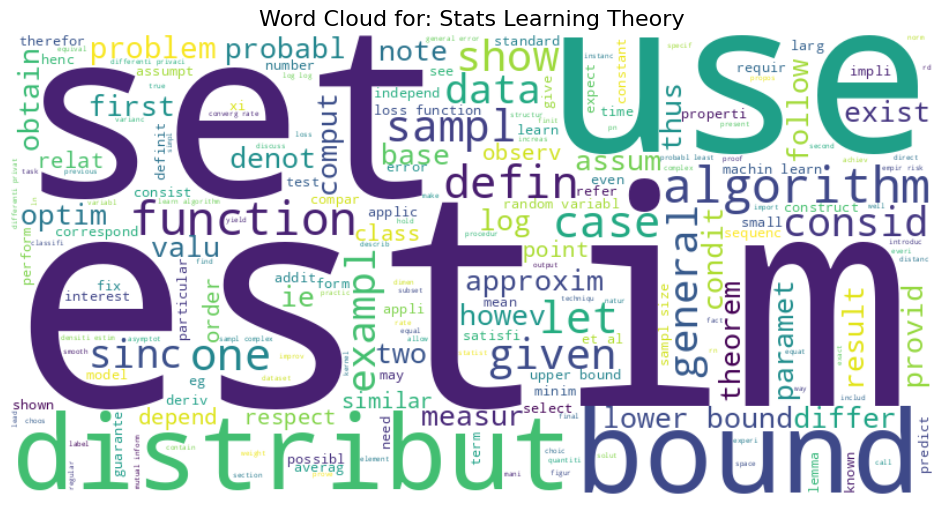

--- 正在绘制: Spiking Models (ID: 1) ---


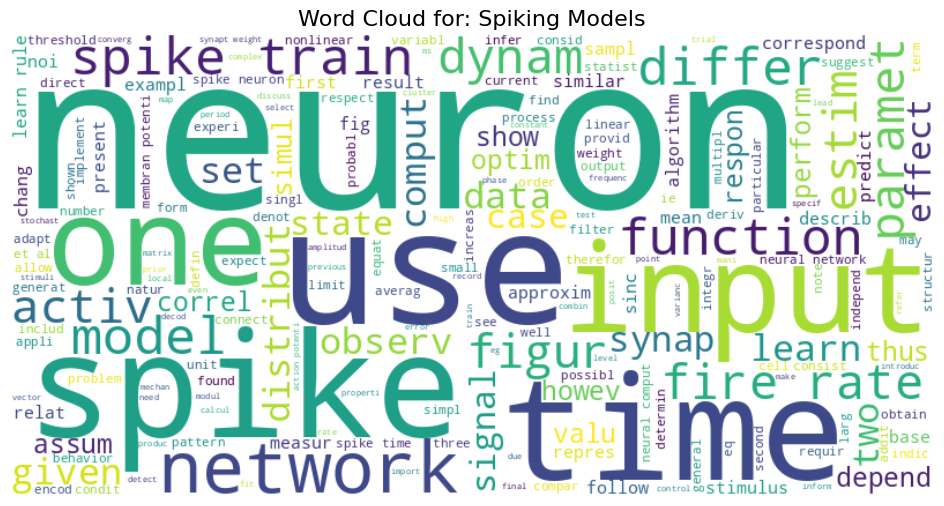

--- 正在绘制: RL Theory (ID: 2) ---


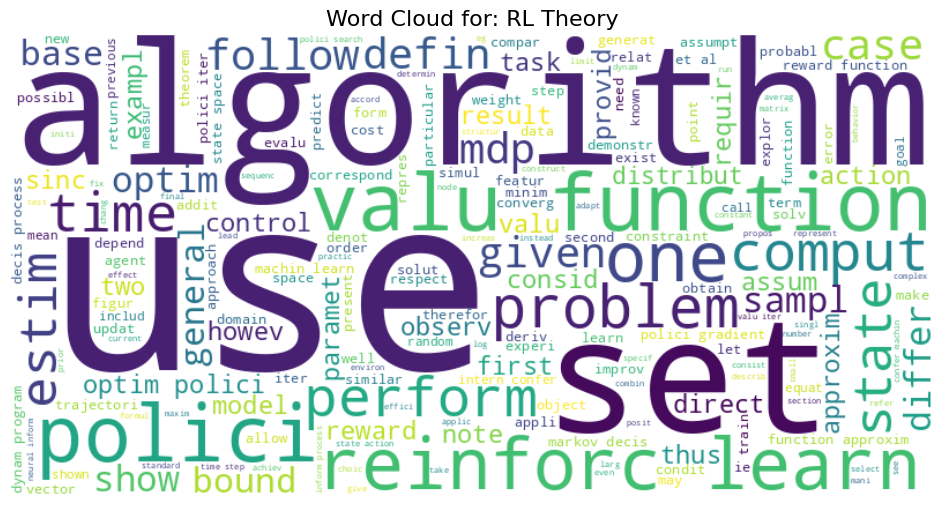

--- 正在绘制: Deep Learning (ID: 3) ---


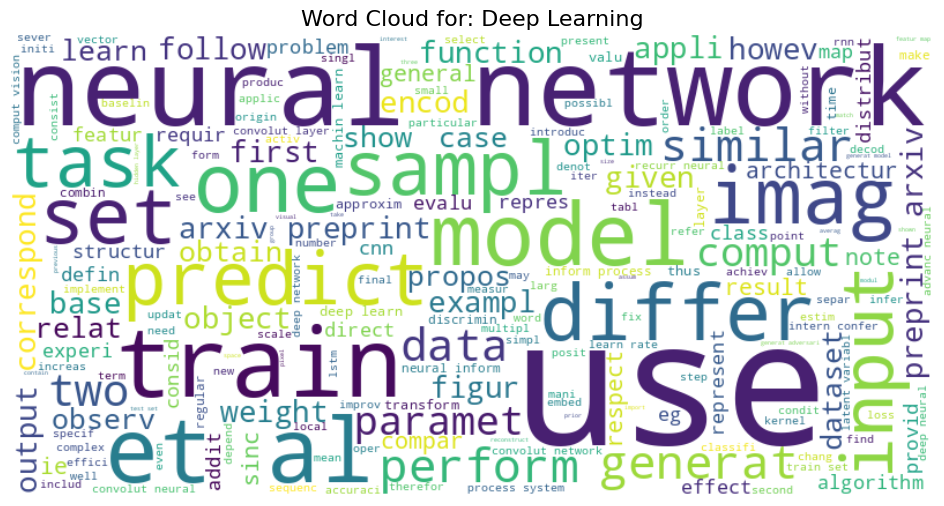

--- 正在绘制: Classic NN (ID: 4) ---


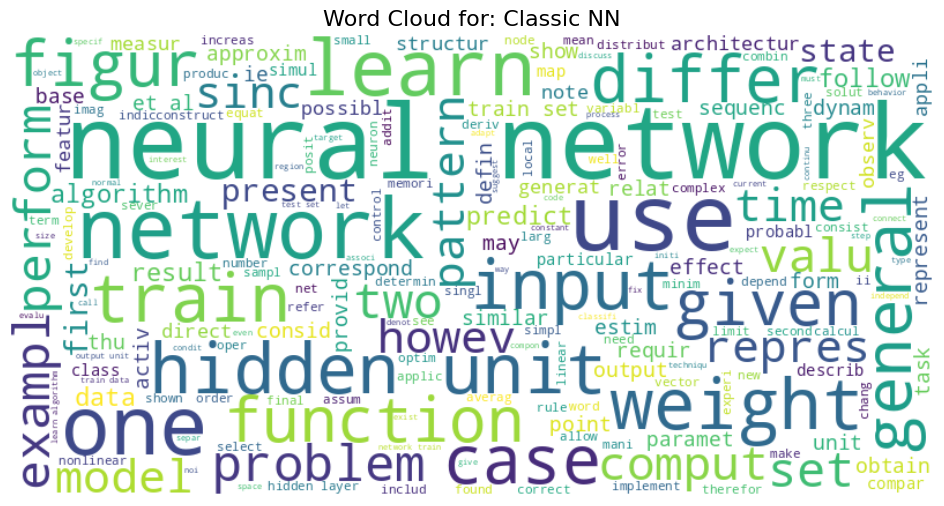

--- 正在绘制: Computer Vision (ID: 5) ---


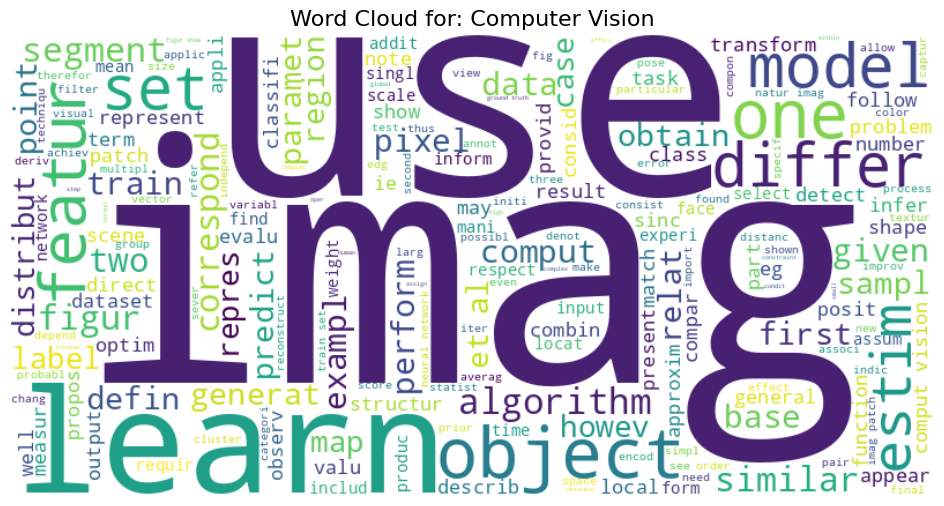

--- 正在绘制: Clustering (ID: 6) ---


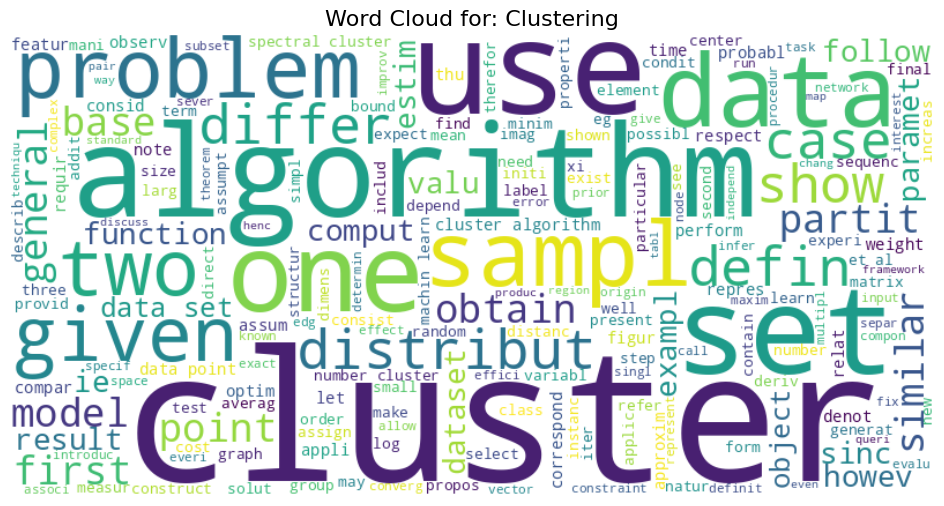

--- 正在绘制: Kernel Methods / SVMs (ID: 7) ---


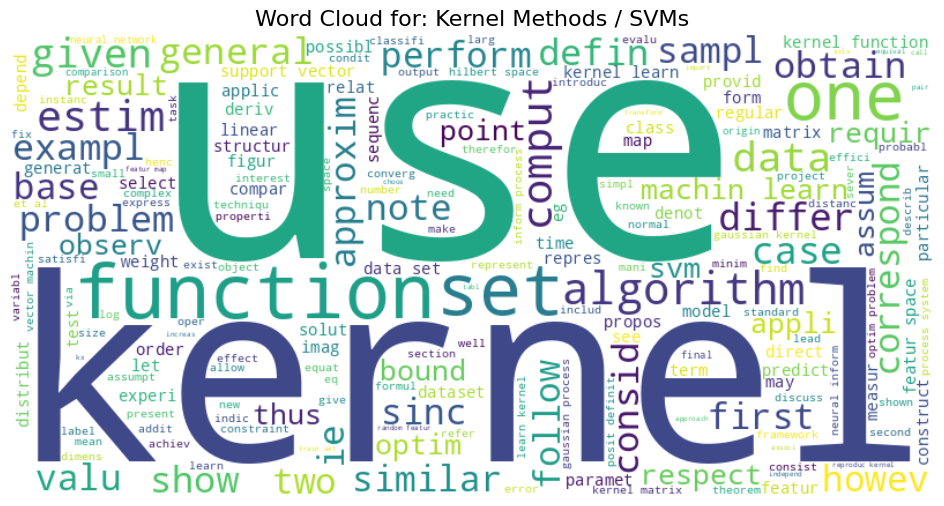

--- 正在绘制: Supervised Learning (ID: 8) ---


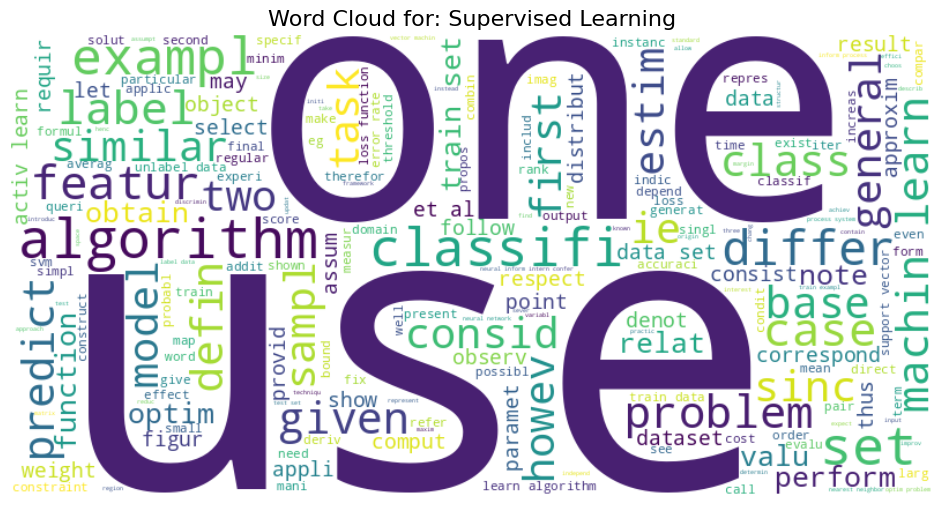

--- 正在绘制: Graphical Models (ID: 9) ---


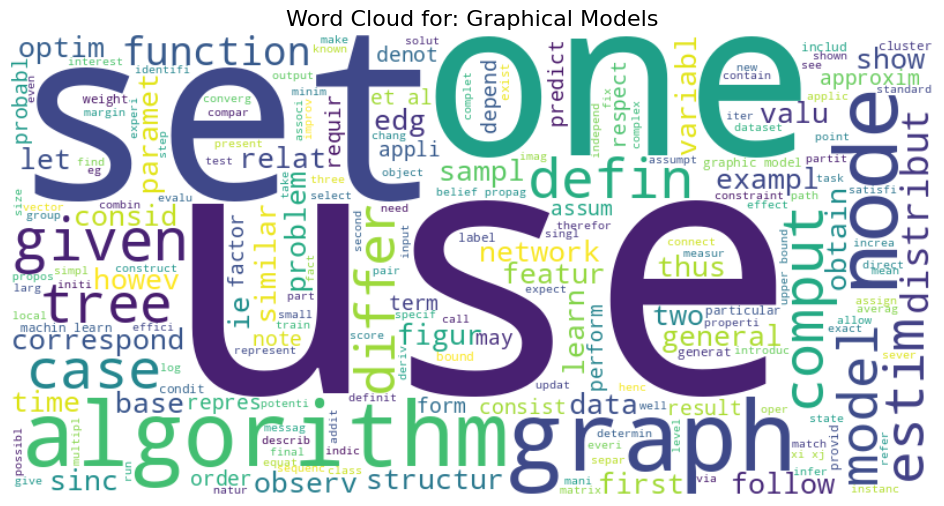

--- 正在绘制: Online Learning / Bandits (ID: 10) ---


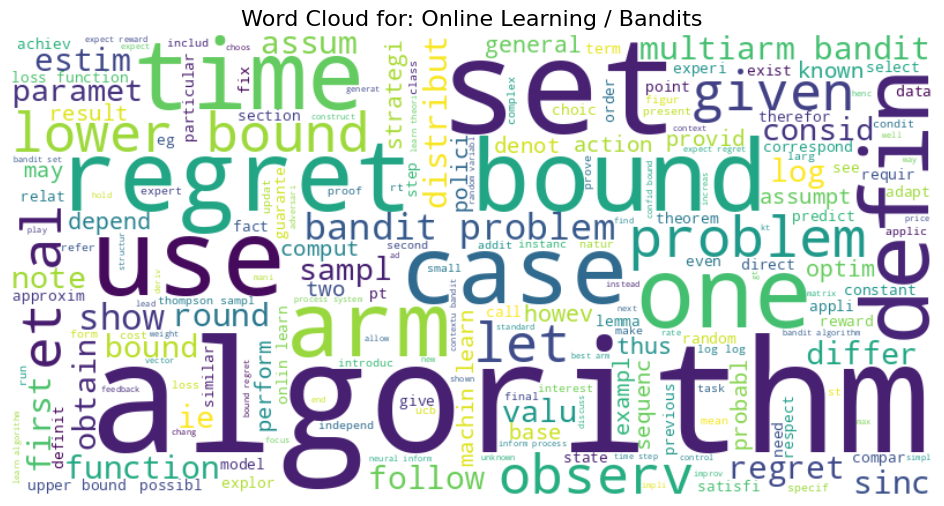

--- 正在绘制: Bayesian Inference (ID: 11) ---


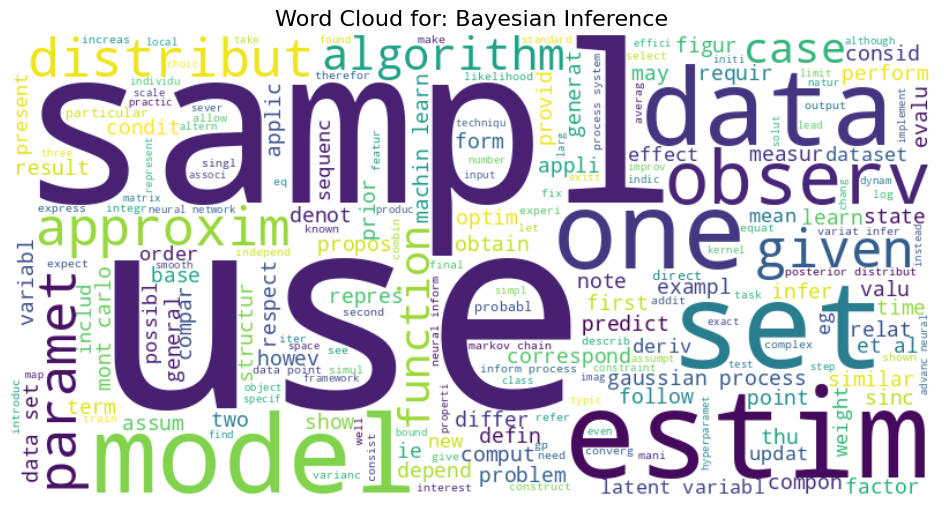

--- 正在绘制: Matrix/Tensor (ID: 12) ---


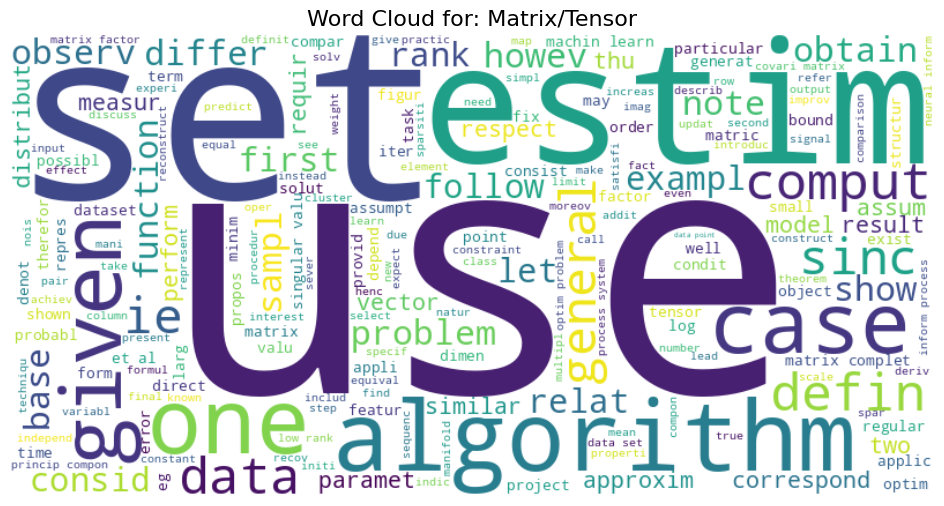

--- 正在绘制: Optimization (ID: 13) ---


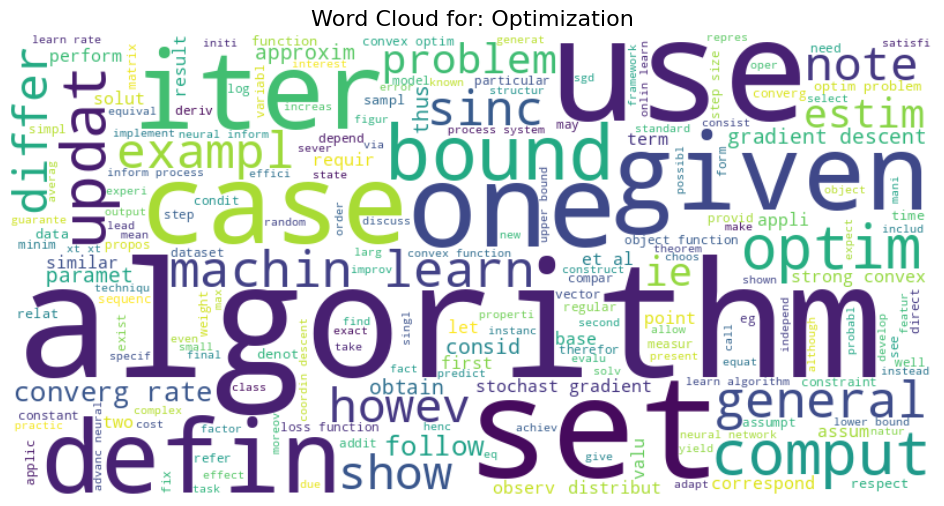

--- 正在绘制: NLP / Topic Models (ID: 14) ---


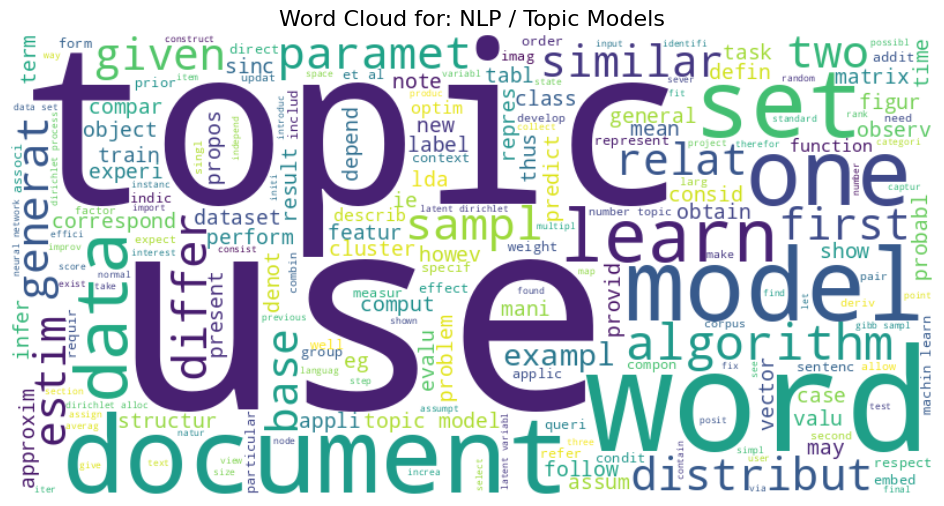

--- 正在绘制: Visual Neuroscience (ID: 15) ---


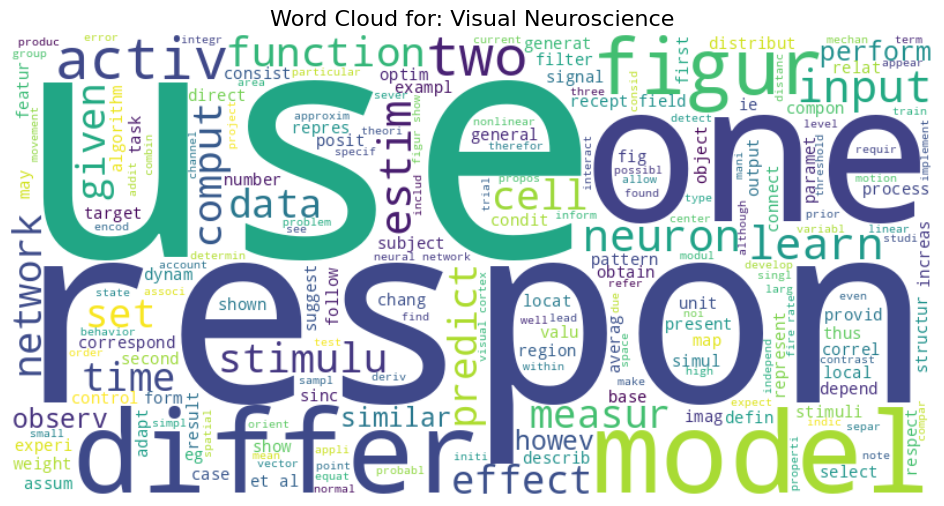

--- 正在绘制: Hardware / Neuromorphic (ID: 16) ---


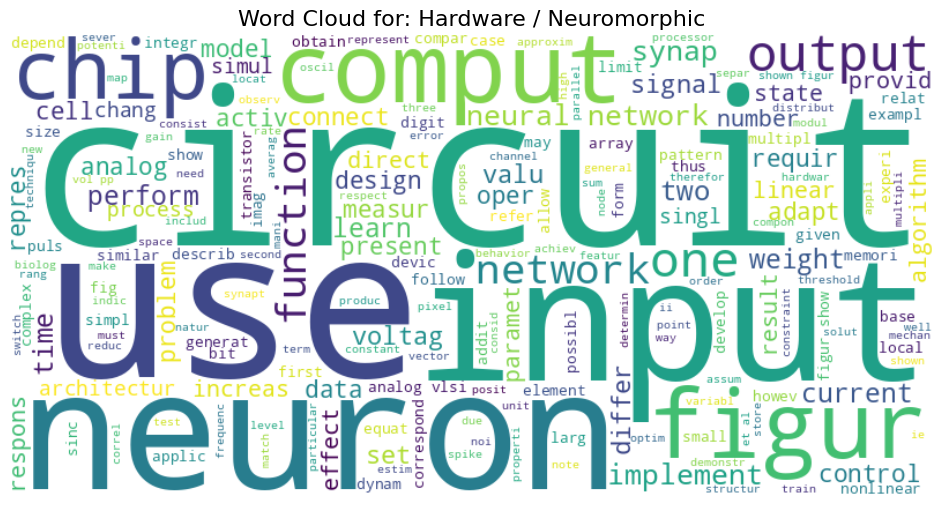

--- 正在绘制: Submodular Optimization (ID: 17) ---


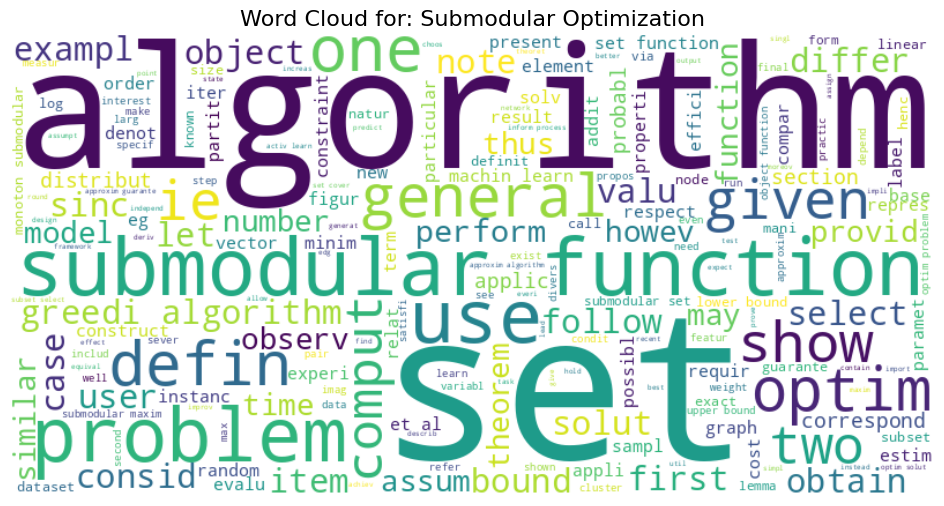

--- 正在绘制: Game Theory (ID: 18) ---


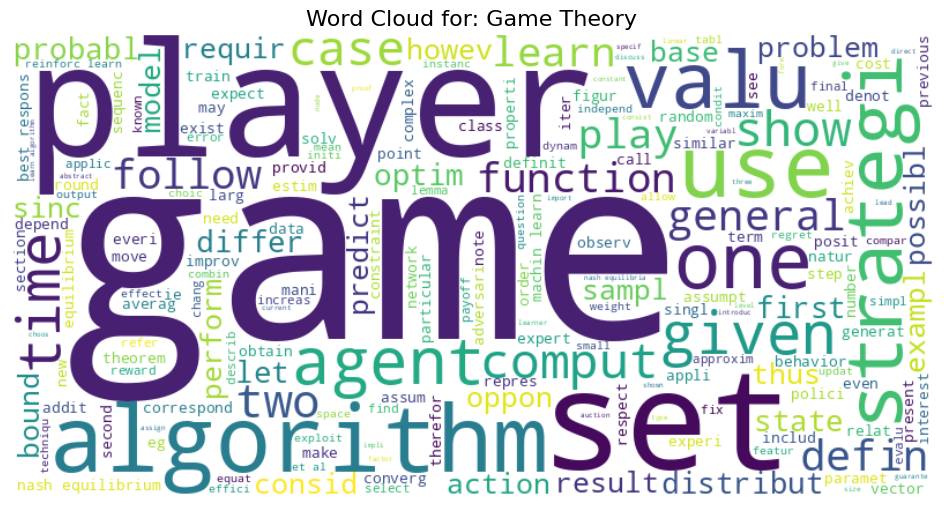

--- 正在绘制: RL Agents (ID: 19) ---


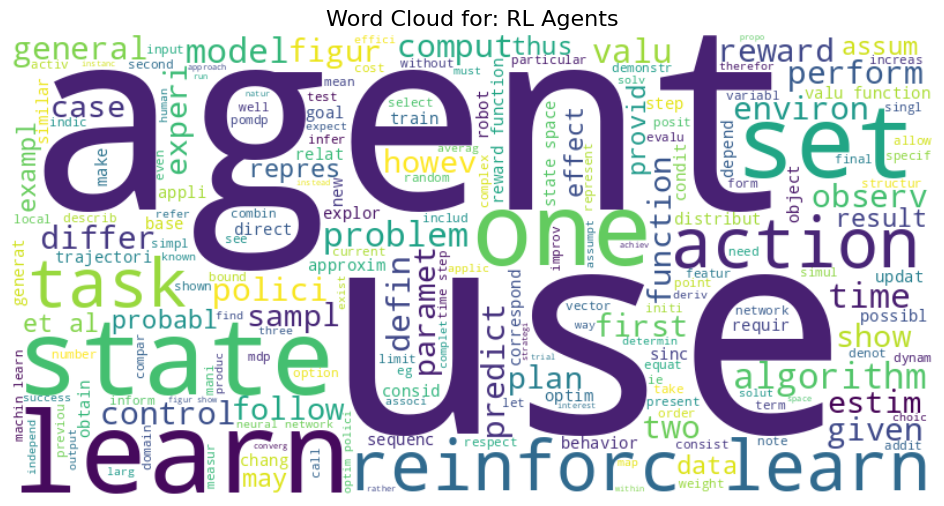


--- 所有词云图绘制完毕 ---


In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from google.colab import drive

# --- 0. 安装和导入所需库 ---
# !pip install wordcloud -q
from wordcloud import WordCloud
import ast # (ast 是“抽象语法树”的缩写，我们将用它安全地将字符串转回列表)

print("\n--- 库导入完成 ---")

# --- 1. 挂载 Google Drive 并设置路径 ---
try:
    drive.mount('/content/drive')
    print("Google Drive 挂载成功！")
except Exception as e:
    print(f"Google Drive 挂载失败: {e}")
    raise RuntimeError("Drive 挂载失败，请检查权限。")

YOUR_PROJECT_PATH = "/content/drive/MyDrive/Colab Notebooks/DSAI5102_Assignment2/code/"
TOPICS_DF_FILE = os.path.join(YOUR_PROJECT_PATH, "df_final_with_topics.csv")

# 你提供的完整主题列表
TOPIC_NAME_MAP = {
    0: "Stats Learning Theory",  # 统计学习理论
    1: "Spiking Models",  # 计算神经科学
    2: "RL Theory",  # 强化学习-理论
    3: "Deep Learning",  # 深度学习
    4: "Classic NN",  # 经典神经网络
    5: "Computer Vision",  # 计算机视觉
    6: "Clustering",  # 聚类算法
    7: "Kernel Methods / SVMs",  # 核方法
    8: "Supervised Learning",  # 监督/半监督学习
    9: "Graphical Models",  # 图模型
    10: "Online Learning / Bandits",  # 在线学习/赌博机
    11: "Bayesian Inference",  # 贝叶斯推断
    12: "Matrix/Tensor",  # 矩阵/张量方法
    13: "Optimization",  # 优化算法
    14: "NLP / Topic Models",  # 自然语言处理
    15: "Visual Neuroscience",  # 视觉神经科学
    16: "Hardware / Neuromorphic",  # 硬件/神经形态
    17: "Submodular Optimization",  # 子模优化
    18: "Game Theory",  # 博弈论
    19: "RL Agents"  # 强化学习-智能体
}

print(f"路径设置完毕: {TOPICS_DF_FILE}")


# --- 2. 加载数据 (并处理 CSV 列表) ---
print("\n--- 正在加载数据... ---")
if not os.path.exists(TOPICS_DF_FILE):
    raise FileNotFoundError(f"未找到 CSV 文件: {TOPICS_DF_FILE}")

df_final = pd.read_csv(TOPICS_DF_FILE)
print(f" > 成功加载: df_final_with_topics.csv (形状: {df_final.shape})")

# --- (!!!) 关键步骤：将字符串转回列表 (!!!) ---
# 检查 'processed_text' 列的第一个元素是否是字符串
# 如果是，就代表我们需要转换
if not df_final.empty and isinstance(df_final['processed_text'].iloc[0], str):
    print(" > 'processed_text' 列是字符串，正在转换回列表...")
    # ast.literal_eval 可以安全地将 "['a', 'b']" 这样的字符串
    # 转换成 ['a', 'b'] 这样的 Python 列表
    try:
        df_final['processed_text'] = df_final['processed_text'].apply(ast.literal_eval)
        print(" > 转换成功！")
    except Exception as e:
        print(f"!!! 转换 'processed_text' 失败: {e}")
        print("    请确保该列是 '[\"word1\", \"word2\"]' 这样的格式。")
        raise
else:
    print(" > 'processed_text' 列已经是列表，无需转换。")

# --- 3. 定义词云绘制函数 ---
def plot_word_cloud(text_blob, title):
    """
    根据输入的文本字符串，绘制词云图
    """
    wc = WordCloud(
        background_color="white",
        max_words=200,
        width=800,
        height=400,
        colormap='viridis', # 你可以换成 'plasma', 'inferno', 'magma' 等
        random_state=42     # 固定随机状态，使词云可复现
    )

    # 生成词云
    wc.generate(text_blob)

    # 绘图
    plt.figure(figsize=(12, 6))
    plt.imshow(wc, interpolation='bilinear')
    plt.title(title, fontsize=16)
    plt.axis("off")
    plt.show()

# --- 4. 循环遍历所有主题并绘制词云 ---
# 这是最有价值的方案：按 NMF 聚类的主题来画
print(f"\n--- 将为 {len(TOPIC_NAME_MAP)} 个主题生成词云 ---")

# (!!!) 你可以先测试几个，以免一次生成 20 个图
# 例如，只测试前 3 个:
# for topic_id, topic_name in list(TOPIC_NAME_MAP.items())[:3]:

# 完整运行：
for topic_id, topic_name in TOPIC_NAME_MAP.items():

    # 4.1 筛选出这个主题的所有行
    topic_df = df_final[df_final['topic_id'] == topic_id]

    if topic_df.empty:
        print(f"!!! 主题 {topic_id} ({topic_name}) 没有文档，跳过。")
        continue

    # 4.2 合并所有 'processed_text' 列表
    # (['a', 'b'], ['c', 'd']) -> ['a', 'b', 'c', 'd']
    try:
        all_tokens_for_topic = topic_df['processed_text'].sum()
    except TypeError:
        print(f"!!! 警告: 主题 '{topic_name}' 的 'processed_text' 列似乎不是列表。")
        print("    请检查步骤 2 中的转换是否成功。")
        continue

    # 4.3 将 token 列表转换成一个长字符串
    # ['a', 'b', 'c', 'd'] -> "a b c d"
    text_blob_for_topic = " ".join(all_tokens_for_topic)

    # 4.4 绘制词云
    print(f"--- 正在绘制: {topic_name} (ID: {topic_id}) ---")
    plot_word_cloud(text_blob_for_topic, f"Word Cloud for: {topic_name}")

print("\n--- 所有词云图绘制完毕 ---")

In [ ]:
# from google.colab import drive
# try:
#     drive.mount('/content/drive')
#     print("Google Drive 挂载成功！")
# except Exception as e:
#     print(f"Google Drive 挂载失败: {e}")
#     print("请确保你是在 Google Colab 环境中运行。")

# YOUR_PROJECT_PATH = "/content/drive/MyDrive/Colab Notebooks/DSAI5102_Assignment2/code/"
# print(f"将从以下路径加载文件: {YOUR_PROJECT_PATH}")

# 使用 os.path.join 自动构建完整的文件路径
TOPICS_DF_FILE = ("../processed_papers_WITH_TOPICS.pkl")

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC

# --- 准备 X 和 y ---

# X 是你用来训练 NMF 的同一个 TF-IDF 矩阵
# 确保 tfidf_matrix 变量在你的内存中！
if 'tfidf_matrix' not in locals():
    print("!!! 错误: 'tfidf_matrix' 变量未找到。")
    print("     请确保在运行 NMF 之前的单元格中已定义了 tfidf_matrix")
else:
    X = tfidf_matrix

    # y 是你的主题标签 (数字)
    y = df_final['topic_id']

    # 检查 X 和 y 的形状是否匹配
    print(f"特征 X 的形状: {X.shape}")
    print(f"标签 y 的形状: {y.shape}")

    # --- 划分训练集和测试集 ---
    # 我们使用 80% 训练，20% 测试
    # stratify=y 保证了在训练集和测试集中，每个主题的比例是均衡的 (非常重要!)
    X_train, X_test, y_train, y_test = train_test_split(
        X, y,
        test_size=0.2,
        random_state=42,
        stratify=y
    )

    print(f"\n训练集大小: {X_train.shape}")
    print(f"测试集大小: {X_test.shape}")

print("--- 正在训练: 逻辑回归 (Logistic Regression) ---")
print("(这可能需要一点时间...)")

# 1. 初始化模型
# solver='saga' 非常适合大型稀疏数据集
# max_iter=1000 确保它有足够的时间收敛
log_model = LogisticRegression(
    solver='saga',
    multi_class='multinomial',
    max_iter=1000,
    random_state=42,
    n_jobs=-1 # 使用所有 CPU 核心
)

# 2. 训练模型
log_model.fit(X_train, y_train)

# 3. 预测测试集
y_pred_log = log_model.predict(X_test)

# 4. 评估
print(f"逻辑回归 (Recommended) 总体准确率: {accuracy_score(y_test, y_pred_log):.4f}")
print("\n详细分类报告 (Classification Report):")
print(classification_report(y_test, y_pred_log, target_names=TOPIC_NAME_MAP.values()))